# Urban Sustainability & Renewable Energy Potential in the Baltic States

## course: Resposible Data Analytics course
Name: **Milad Torabi**  
Student ID: **6354688**
    
Name: **Jennifer Hu**  
student ID: **5406625**

# Project Overview:

#### Context:
- Focus on **three Baltic capitals: Vilnius, Tallinn, and Riga**
- Analysis based on **5 years of meteorological data from NASA POWER**(from 2018 to 2022)
- Data Source: https://power.larc.nasa.gov/data-access-viewer/

#### Objective:
- Investigate **how key weather parameters affect renewable energy potential and urban sustainability**
- Provide actionable insights for **urban planning and energy strategies**  

# Research Questions and Sub-Questions:

#### Primary Research Question:
- How do variations in meteorological parameters influence renewable energy potential and urban sustainability in Vilnius, Tallinn, and Riga?
    
#### Sub-Questions:
##### 1.Descriptive Analytics:
- What are the **historical trends and seasonal patterns** of **key weather variables?**  
##### 2.Diagnostic Analytics:  
- How do solar, temperature, moisture, and wind **variables correlate and interact**?  
##### 3.Predictive Analytics:  
- Can we **forecast seasonal or extreme weather events** that impact renewable energy generation?  
##### 4.Prescriptive Analytics:  
- What **urban planning strategies** can **optimize renewable energy deployment** and mitigate adverse weather impacts?

# Analysis Pipeline(Helicopter View)

### 1.Data Collection, Understanding, and Preprocessing:  
    
- Load the CSV files and Check the structure.
- Inspect the datasets for missing values, duplicates, and inconsistencies.
- Verify consistency across the three datasets.
- Merge datasets to align variables for Vilnius, Riga, and Tallinn.
- Exploration of the Dataset and Relevant Variables
- Domain-based categorization and description of the available variables.
- Filter out unnecessary variables, keeping only the key variables of interest.
- Potential Risks and Bias Identification  
#### 2.Descriptive Analytics
#### 3.Diagnostic Analytics
#### 4.Predictive Analytics
#### 5.Prescriptive Analytics

In [1]:
# import required libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA

In [2]:
# To Download a Google Drive File via Link
# !pip install gdown
import gdown

In [3]:
# Extract file IDs from the links
Riga_id = "1pNvOTLYSKb7G3fSw3xx3pi7B2_AoQg_H"
Talinn_id = "1xPeyM2KBVQXXyLvDTCSDiE39Ag8-1jut"
Vilnius_id = "1aqkwsQvBPRVQluvhYgb9QcMOxrmqn8ed"

# Download the files correctly
data_Riga = gdown.download(f"https://drive.google.com/uc?id={Riga_id}", "data_Riga.ext", quiet=False)
data_Talinn = gdown.download(f"https://drive.google.com/uc?id={Talinn_id}", "data_Talinn.ext", quiet=False)
data_Vilnius = gdown.download(f"https://drive.google.com/uc?id={Vilnius_id}", "data_Vilnius.ext", quiet=False)

print("Files downloaded successfully!")

Downloading...
From: https://drive.google.com/uc?id=1pNvOTLYSKb7G3fSw3xx3pi7B2_AoQg_H
To: C:\Users\LENOVO\Desktop\New folder\data_Riga.ext
100%|███████████████████████████████████████████████████████████████████████████████| 202k/202k [00:00<00:00, 5.66MB/s]
Downloading...
From: https://drive.google.com/uc?id=1xPeyM2KBVQXXyLvDTCSDiE39Ag8-1jut
To: C:\Users\LENOVO\Desktop\New folder\data_Talinn.ext
100%|███████████████████████████████████████████████████████████████████████████████| 202k/202k [00:00<00:00, 3.33MB/s]
Downloading...
From: https://drive.google.com/uc?id=1aqkwsQvBPRVQluvhYgb9QcMOxrmqn8ed
To: C:\Users\LENOVO\Desktop\New folder\data_Vilnius.ext
100%|███████████████████████████████████████████████████████████████████████████████| 201k/201k [00:00<00:00, 3.41MB/s]

Files downloaded successfully!


In [4]:
with open(data_Riga, 'r') as file:
    print(file.read())

-BEGIN HEADER-
NASA/POWER Source Native Resolution Daily Data 
Dates (month/day/year): 01/01/2018 through 12/31/2022 in LST
Location: latitude  56.9474   longitude 24.1069 
elevation from MERRA-2: Average for 0.5 x 0.625 degree lat/lon region = 42.62 meters
The value for missing source data that cannot be computed or is outside of the sources availability range: -999 
parameter(s): 
ALLSKY_SFC_SW_DWN       CERES SYN1deg All Sky Surface Shortwave Downward Irradiance (kW-hr/m^2/day) 
CLRSKY_SFC_SW_DWN       CERES SYN1deg Clear Sky Surface Shortwave Downward Irradiance (kW-hr/m^2/day) 
ALLSKY_KT               CERES SYN1deg All Sky Insolation Clearness Index (dimensionless) 
ALLSKY_SFC_LW_DWN       CERES SYN1deg All Sky Surface Longwave Downward Irradiance (kW-hr/m^2/day) 
ALLSKY_SFC_UVA          CERES SYN1deg All Sky Surface UVA Irradiance (kW-hr/m^2/day) 
ALLSKY_SFC_UV_INDEX     CERES SYN1deg All Sky Surface UV Index (W m-2 x 40) 
T2M                     MERRA-2 Temperature at 2 Meters (

In [5]:
# The specific information about three Cities:
#  Riga Location: latitude  56.9474   longitude 24.1069
#  Vilnius Location: latitude  54.691   longitude 25.2823
#  Tallin Location: latitude  59.4324   longitude 24.7441

# Since the first 27 rows of the data has differnet structure, we seprate the datasets into 2 parts. these 27 rows are
# the Header of the data and the following table part includs the features of each city which we want to analyzie

data_Riga = pd.read_csv( data_Riga, skiprows=27)
data_Vilnius = pd.read_csv( data_Vilnius, skiprows=27)
data_Talinn = pd.read_csv( data_Talinn, skiprows=27)

In [6]:
# check the consistency of the datasets before merging them
print(data_Vilnius.columns == data_Riga.columns)
print(data_Riga.columns == data_Talinn.columns)

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True]
[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True]


In [7]:
# since columns(features) of the 3 datasets are the same, we can concatenate them one after the
# other to have a single data set, but we need to only add a column representing the city of them.
data_Vilnius['City']='Vilnius'
data_Talinn['City']='Tallinn'
data_Riga['City']='Riga'

# Correct ignore_index usage
dataset = pd.concat([data_Vilnius, data_Talinn, data_Riga], ignore_index=True)

# Rename columns to match expected names
dataset = dataset.rename(columns={'YEAR': 'year', 'MO': 'month', 'DY': 'day'})

# Convert to datetime
dataset['DATE'] = pd.to_datetime(dataset[['year', 'month', 'day']])

# Setting 'DATE' as the index
dataset.set_index('DATE', inplace=True)

# Dropping redundant columns after conversion
dataset.drop(columns=['year', 'month', 'day'], inplace=True)

# Display dataset # Now dataset is indexed by 'DAY'
dataset

,ALLSKY_SFC_SW_DWN,CLRSKY_SFC_SW_DWN,ALLSKY_KT,ALLSKY_SFC_LW_DWN,ALLSKY_SFC_UVA,ALLSKY_SFC_UV_INDEX,T2M,T2MDEW,T2MWET,TS,QV2M,RH2M,PRECTOTCORR,PS,WS10M,WS10M_MAX,WS10M_MIN,WS10M_RANGE,WD10M,City
DATE,,,,,,,,,,,,,,,,,,,,
2018-01-01,0.14,0.66,0.10,7.15,0.01,0.01,0.88,0.63,0.76,0.56,4.07,98.22,4.49,98.35,4.74,6.80,3.03,3.77,196.0,Vilnius
2018-01-02,0.28,0.79,0.20,7.00,0.02,0.01,0.03,-0.22,-0.10,-0.06,3.79,98.21,0.88,98.88,2.76,3.30,2.02,1.28,190.2,Vilnius
2018-01-03,0.24,0.77,0.17,7.09,0.01,0.01,0.10,-0.23,-0.06,-0.19,3.81,97.80,0.64,98.38,3.30,5.09,1.95,3.14,163.5,Vilnius
2018-01-04,0.21,0.71,0.14,7.30,0.01,0.01,1.03,0.72,0.88,0.71,4.11,97.68,0.59,97.79,5.52,6.01,5.11,0.90,172.5,Vilnius
2018-01-05,0.30,0.76,0.20,7.41,0.02,0.01,0.82,0.52,0.67,0.62,4.04,97.75,2.33,97.97,5.64,7.00,4.66,2.34,176.7,Vilnius
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-27,0.29,0.59,0.27,6.64,0.02,0.01,0.25,-0.41,-0.08,-0.04,3.73,95.95,2.15,100.01,7.00,7.95,5.72,2.23,233.5,Riga
2022-12-28,0.29,0.54,0.27,6.80,0.02,0.01,0.43,-0.12,0.15,0.36,3.75,96.00,2.55,100.53,5.90,7.35,4.79,2.56,228.3,Riga
2022-12-29,0.22,0.50,0.20,6.93,0.01,0.01,0.28,-0.13,0.08,0.29,3.78,97.20,2.61,99.98,5.84,7.35,4.81,2.54,177.4,Riga


In [8]:
# Check for any missing value or feature
print(f'missing value or feature per column: \n{dataset.isna().sum()}\n')

# Display rows with missing values
print(f'rows with missing values: {dataset[dataset.isnull().any(axis=1)]}')

# Count duplicate rows
print(f'Duplicate rows: {dataset.duplicated().sum()}')

# check the data type of each column
print(f'Data types: {dataset.dtypes}')

missing value or feature per column: 
ALLSKY_SFC_SW_DWN      0
CLRSKY_SFC_SW_DWN      0
ALLSKY_KT              0
ALLSKY_SFC_LW_DWN      0
ALLSKY_SFC_UVA         0
ALLSKY_SFC_UV_INDEX    0
T2M                    0
T2MDEW                 0
T2MWET                 0
TS                     0
QV2M                   0
RH2M                   0
PRECTOTCORR            0
PS                     0
WS10M                  0
WS10M_MAX              0
WS10M_MIN              0
WS10M_RANGE            0
WD10M                  0
City                   0
dtype: int64

rows with missing values: Empty DataFrame
Columns: [ALLSKY_SFC_SW_DWN, CLRSKY_SFC_SW_DWN, ALLSKY_KT, ALLSKY_SFC_LW_DWN, ALLSKY_SFC_UVA, ALLSKY_SFC_UV_INDEX, T2M, T2MDEW, T2MWET, TS, QV2M, RH2M, PRECTOTCORR, PS, WS10M, WS10M_MAX, WS10M_MIN, WS10M_RANGE, WD10M, City]
Index: []
Duplicate rows: 0
Data types: ALLSKY_SFC_SW_DWN      float64
CLRSKY_SFC_SW_DWN      float64
ALLSKY_KT              float64
ALLSKY_SFC_LW_DWN      float64
ALLSKY_SFC_UVA    

#### Data Preprocessing Report
- The dataset contains **no missing values** in either rows or columns.  

- **No duplicate entries** are present, ensuring data integrity.  

- All columns are of **numeric type (float64)**, except for one column ("City") which is of type object.  

- The "City" column remains as a categorical variable in text format for now, as it is needed for analysis.  

- **Encoding of the "City" column** (e.g., one-hot or ordinal encoding) will be applied later when performing machine learning tasks.  

- **The dataset was merged** to align **variables for Vilnius, Riga, and Tallinn**, ensuring consistency across cities.

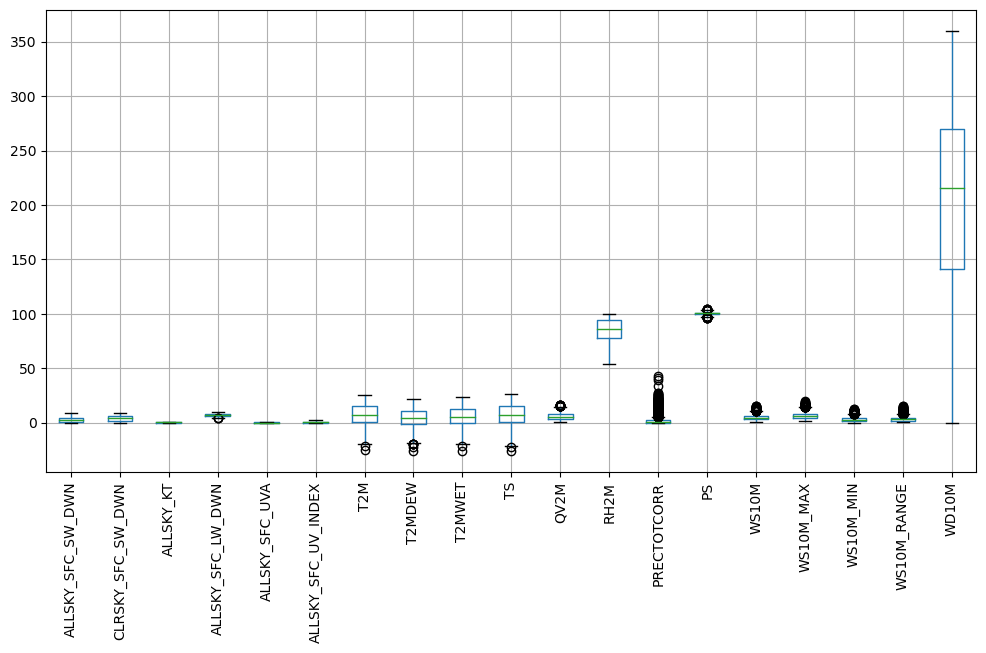

In [9]:
# Check for outliers using boxplots
plt.figure(figsize=(12, 6))
dataset.boxplot(rot=90)

plt.show()

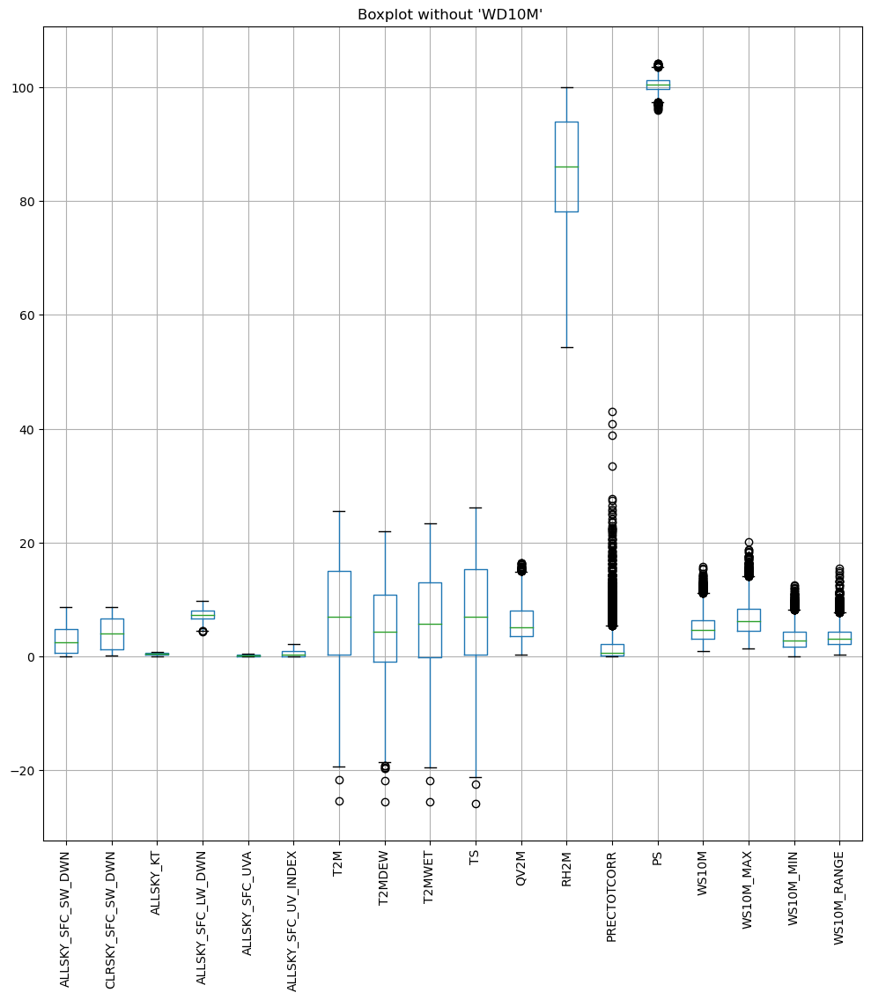

In [10]:
# since the'WD10M' column distorts the boxplot and also does not have any outliers,
# we need to exclude it to make the visualization clearer:
plt.figure(figsize=(12,12))
dataset.drop(columns=['WD10M']).boxplot(rot=90)
plt.title("Boxplot without 'WD10M' ")
plt.show()

In [11]:
#  in order to better understand the columns in which we can see outliers
#  and to Confirm Outliers Numerically:

# List of columns to check for outliers
list_columns_with_outliers = ['ALLSKY_SFC_LW_DWN', 'T2M', 'T2MDEW', 'T2MWET', 'TS',
                              'QV2M', 'PRECTOTCORR', 'PS', 'WS10M', 'WS10M_MAX',
                              'WS10M_MIN', 'WS10M_RANGE']

# Function to detect and print outliers
def Confirm_Outliers(column):
    Q1 = dataset[column].quantile(0.25)
    Q3 = dataset[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filtering outliers
    outliers = dataset[(dataset[column] < lower_bound) | (dataset[column] > upper_bound)]

    return outliers  # Return the outliers

# Loop through columns and print outliers
for column_name in list_columns_with_outliers:
    outliers_df = Confirm_Outliers(column_name)  # Get outliers
    print(f"\nOutliers for column: {column_name}")
    print(outliers_df)


Outliers for column: ALLSKY_SFC_LW_DWN
            ALLSKY_SFC_SW_DWN  CLRSKY_SFC_SW_DWN  ALLSKY_KT  \
DATE                                                          
2018-01-16               1.15               1.16       0.65   
2021-01-16               0.81               1.18       0.45   
2018-01-16               0.93               0.95       0.63   

            ALLSKY_SFC_LW_DWN  ALLSKY_SFC_UVA  ALLSKY_SFC_UV_INDEX    T2M  \
DATE                                                                        
2018-01-16               4.41            0.04                 0.04  -9.84   
2021-01-16               4.44            0.04                 0.03 -21.69   
2018-01-16               4.44            0.04                 0.03  -9.42   

            T2MDEW  T2MWET     TS  QV2M   RH2M  PRECTOTCORR      PS  WS10M  \
DATE                                                                         
2018-01-16  -11.56  -10.70 -10.04  1.49  90.07         0.07   99.27   7.75   
2021-01-16  -21.83  -21.

### Outlier Assessment
- The detected outliers are **genuine data points** rather than errors or noise.  

- These outliers will be **retained** for now and transformed if necessary in later analysis.  

- For machine learning models, techniques like **StandardScaler or RobustScaler** (from sklearn.preprocessing) will be used to minimize the impact of outliers while preserving data integrity.  

In [12]:
# Summary Statistics for each city
summary_stats = dataset.groupby('City').describe()
summary_stats

ALLSKY_SFC_SW_DWN                                                 \
                    count      mean       std   min   25%    50%     75%   
City                                                                       
Riga               1826.0  2.913149  2.358842  0.08  0.61  2.475  4.8425   
Tallinn            1826.0  2.809485  2.421815  0.05  0.44  2.235  4.8175   
Vilnius            1826.0  2.961506  2.278075  0.11  0.73  2.580  4.7500   

              CLRSKY_SFC_SW_DWN            ... WS10M_RANGE          WD10M  \
          max             count      mean  ...         75%    max   count   
City                                       ...                              
Riga     8.62            1826.0  4.071791  ...      4.3775  14.66  1826.0   
Tallinn  8.23            1826.0  3.840641  ...      5.3175  15.56  1826.0   
Vilnius  8.45            1826.0  4.179628  ...      3.4500   8.29  1826.0   

                                                                    
               mean        std  min      25%     50%    75%    max  
City                                                                
Riga     201.764732  89.175901  0.7  146.325  212.65  266.3  359.1  
Tallinn  200.536145  90.755343  0.4  141.175  217.35  265.4  359.9  
Vilnius  201.145071  93.882391  0.1  135.400  217.75  275.1  359.7  

[3 rows x 152 columns]

Since our dataset contains meteorological and solar radiation data, the risks and biases may stem from data quality issues, geographic limitations, and external influences. Here’s how we can systematically analyze and mitigate biases.  
  
#### Potential Risks and Bias Identification:  

- A. Data Quality Issues: we can check for Missing Values & Outliers for all these three datasets.(Already Done)
    
- B. Bias in Time Period  
    The dataset covers only 5 years (2018-2022). Any climate trends beyond this period are not captured, leading to a short-term bias.   
    Solution: If needed, integrate older datasets for a longer-term trend analysis.(but here we focus on 5 years only)      
    Short-Term Analysis Bias: Trends might not reflect long-term climate behavior, leading to incorrect predictions.  
    
- C. Geographic Bias  
    our dataset only covers Vilnius, Tallinn, and Riga.    
    Any insights may not generalize to other regions with different climatic conditions.    
    Solution: we can Compare with data from cities in similar latitudes but different climates.    
    Geographic Limitation: Applying insights from three cities to other locations can be misleading.  
    
- D. External Influences (Climate Change, Urbanization)   
    Temperature changes may be affected by urban heat islands.  
    Changes in precipitation and wind speed could be influenced by climate change trends rather than local factors.  
    Solution: we can Compare data with global climate change trends.  

## Exploration of the Dataset and Relevant Variables  

The NASA POWER dataset has a variety of meteorological variables and solar radiation measurements that are relevant to urban sustainability and renewable energy.  

### Understanding the Parameters:
- All parameters based on NASA data:<pre>  
ALLSKY_SFC_SW_DWN :   All Sky Surface Shortwave Downward Irradiance (kW-hr/m^2/day)  
CLRSKY_SFC_SW_DWN :   Clear Sky Surface Shortwave Downward Irradiance (kW-hr/m^2/day)  
ALLSKY_KT :           All Sky Insolation Clearness Index (dimensionless)  
ALLSKY_SFC_LW_DWN :   All Sky Surface Longwave Downward Irradiance (kW-hr/m^2/day)  
ALLSKY_SFC_UVA :      All Sky Surface UVA Irradiance (kW-hr/m^2/day)  
ALLSKY_SFC_UV_INDEX : All Sky Surface UV Index (W m-2 x 40)  
T2M :                 Temperature at 2 Meters (C)  
T2MDEW :              Dew/Frost Point at 2 Meters (C)  
T2MWET :              Wet Bulb Temperature at 2 Meters (C)  
TS :                  Earth Skin Temperature (C)  
QV2M :                Specific Humidity at 2 Meters (g/kg)  
RH2M :                Relative Humidity at 2 Meters (%)  
PRECTOTCORR :         Precipitation Corrected (mm/day)  
PS :                  Surface Pressure (kPa)  
WS10M :               Wind Speed at 10 Meters (m/s)  
WS10M_MAX :           Wind Speed at 10 Meters Maximum (m/s)  
WS10M_MIN :           Wind Speed at 10 Meters Minimum (m/s)  
WS10M_RANGE :         Wind Speed at 10 Meters Range (m/s)  
WD10M :               Wind Direction at 10 Meters (Degrees) </pre>

#####  1.Solar Radiation & UV-Related Variables (CERES SYN1deg):

- ALLSKY_SFC_SW_DWN: Total shortwave (SW) radiation received at the surface under all sky conditions (including clouds).  
- CLRSKY_SFC_SW_DWN: Shortwave radiation received at the surface assuming clear skies (no clouds).  
- ALLSKY_KT: Clearness index, representing the fraction of solar radiation transmitted through the atmosphere (higher values mean clearer skies).  
- ALLSKY_SFC_LW_DWN: Longwave (LW) radiation received at the surface under all sky conditions, typically influenced by atmospheric temperature and humidity.  
- ALLSKY_SFC_UVA: Ultraviolet-A (UVA) radiation received at the surface.  
- ALLSKY_SFC_UV_INDEX: A measure of UV intensity, affecting skin exposure risks.  


##### 2.Temperature & Humidity Variables (MERRA-2)

- 2M: Air temperature at 2 meters above the ground.
- T2MDEW: Dew point temperature, indicating the temperature at which air becomes saturated with moisture.
- T2MWET: Wet bulb temperature, relevant for heat stress analysis.
- TS: Skin temperature of the Earth’s surface (land/sea surface).
- QV2M: Specific humidity, measuring the amount of water vapor in the air.
- RH2M: Relative humidity, indicating moisture content relative to the air's capacity.

##### 3.Precipitation & Pressure (MERRA-2)

- PRECTOTCORR: Daily corrected total precipitation.
- PS: Surface pressure, useful in weather pattern analysis.


##### 4.Wind Variables (MERRA-2)

- WS10M: Wind speed at 10 meters above the ground.
- WS10M_MAX: Maximum wind speed recorded at 10 meters.
- WS10M_MIN: Minimum wind speed recorded at 10 meters.
- WS10M_RANGE: Difference between maximum and minimum wind speed.
- WD10M: Wind direction at 10 meters (in degrees).

These variables collectively enable an in-depth exploration across descriptive, diagnostic, predictive, and prescriptive analyses related to urban energy and climate challenges.

# domain-based categorization and description of the available variables:  
To determine the most prominent features among the 19 provided in the NASA dataset when it comes to key weather variables, especially in the context of urban energy and climate challenges, we need to identify which variables are essential for describing weather conditions and have significant impacts on applications like energy demand, climate analysis, and urban planning. The dataset includes variables from CERES SYN1deg (solar radiation and UV-related) and MERRA-2 (temperature, humidity, precipitation, pressure, and wind). Let’s evaluate these based on their relevance and common usage in meteorology and related fields.

### Core Weather Variables
Key weather variables are typically those that define the state of the atmosphere and are widely used in weather forecasting, climate studies, and practical applications. These often include temperature, humidity, precipitation, wind, pressure, and solar radiation. Given our project overview and the dataset’s focus on urban energy and climate challenges, we’ll prioritize variables that directly influence energy use (e.g., heating, cooling, solar power) and climate phenomena (e.g., precipitation patterns, heat stress).

#### 1. Temperature
Temperature is a fundamental weather variable, driving energy demands for heating and cooling in urban settings. Among the temperature-related variables:
- **T2M**: Air temperature at 2 meters above the ground is the standard measurement reported in weather forecasts and used in energy models.
- **TS**: Surface skin temperature is more relevant for land-surface interactions but less directly tied to human experience or building energy needs.
- **T2MDEW** (dew point) and **T2MWET** (wet bulb temperature) provide additional moisture-related insights but are supplementary to air temperature for general weather description.

**T2M** stands out as the most prominent due to its universal application and direct relevance.

#### 2. Humidity
Humidity affects human comfort, cooling loads, and atmospheric processes. The options are:
- **RH2M**: Relative humidity at 2 meters is commonly reported in weather forecasts and relates directly to perceived moisture, making it intuitive and widely applicable.
- **QV2M**: Specific humidity is a precise scientific measure but less commonly used in everyday contexts.
- **T2MDEW** and **T2MWET** overlap with humidity but are more specialized (e.g., T2MWET for heat stress).

**RH2M** is the most prominent humidity variable due to its standard use and relevance to urban energy (e.g., air conditioning efficiency).

#### 3. Precipitation
Precipitation is critical for water resource management, urban drainage, and climate impacts. The dataset offers:
- **PRECTOTCORR**: Daily corrected total precipitation, which is a direct and comprehensive measure of rainfall or snowfall.

**PRECTOTCORR** is clearly prominent as the sole precipitation variable and essential for climate and urban planning.

#### 4. Wind
Wind influences ventilation, pollutant dispersion, and renewable energy potential. The wind variables include:
- **WS10M**: Wind speed at 10 meters is the standard measure for weather reporting and energy applications (e.g., wind power).
- **WD10M**: Wind direction at 10 meters complements wind speed by indicating airflow patterns, crucial for urban microclimates and air quality.
- **WS10M_MAX**, **WS10M_MIN**, and **WS10M_RANGE** provide additional detail but are derived from WS10M and less fundamental.

**WS10M** and **WD10M** are the most prominent, offering a complete picture of wind behavior with broad applicability.

#### 5. Pressure
Surface pressure helps analyze weather systems (e.g., highs and lows). The dataset includes:
- **PS**: Surface pressure, a standard meteorological variable used in forecasting and understanding atmospheric dynamics.

**PS** is prominent as a core variable, though its direct impact on urban energy may be less immediate than others.

#### 6. Solar Radiation and UV-Related Variables:
Solar radiation is vital for energy applications (e.g., solar power, building heat gain) and climate energy balances. The options are:
- **ALLSKY_SFC_SW_DWN**: Total shortwave radiation at the surface under all sky conditions directly measures solar energy input, affecting temperature and energy demand.
- **CLRSKY_SFC_SW_DWN**: Clear-sky shortwave radiation is a theoretical baseline, less practical for real-world conditions.
- **ALLSKY_KT**: Clearness index indicates cloudiness but is derived from radiation data.
- **ALLSKY_SFC_LW_DWN**: Longwave radiation relates to atmospheric heat retention (e.g., nighttime cooling), significant for climate and urban heat islands.
- **ALLSKY_SFC_UVA** and **ALLSKY_SFC_UV_INDEX**: UV-specific variables are important for health but narrower in scope.

**ALLSKY_SFC_SW_DWN** is the most prominent solar variable due to its direct relevance to energy and climate, with **ALLSKY_SFC_LW_DWN** as a strong contender for thermal balance considerations.

### Contextual Relevance: Renewable Energy Systems and Urban Sustainability

Several studies show that only a few key meteorological variables consistently dominate both **renewable energy potential estimation** and **urban sustainability** analyses. For example, in the solar energy domain, the surface shortwave downward irradiance variables—both all‐sky (ALLSKY_SFC_SW_DWN) and clear‐sky (CLRSKY_SFC_SW_DWN)—along with the insolation clearness index (ALLSKY_KT), are fundamental because they directly determine the available solar energy for photovoltaic (PV) conversion.  

Similarly, **wind energy assessments** rely heavily on **wind speed metrics**. Variables such as **WS10M** (including its maximum, minimum, and range) and **wind direction (WD10M)** critically influence turbine performance by determining the energy capture potential and the dynamics of the wake effects.  

In **urban sustainability studies**, variables governing the urban microclimate and building energy demands—such as **the 2‐meter temperature (T2M), relative humidity (RH2M), and precipitation (PRECTOTCORR)**—play a central role. These parameters not only affect the efficiency and output of renewable energy systems (for example, through their influence on PV and wind performance) but also drive **urban energy consumption patterns** by influencing heating, cooling, and ventilation needs, as well as indoor and outdoor air quality.  

For example, [Qu et al. (2025)](https://www.mdpi.com/2071-1050/17/1/87) demonstrate the **dominant influence of solar irradiance** (as captured by variables like ALLSKY_SFC_SW_DWN and ALLSKY_KT) on energy consumption variability in renewable-dominated systems. Likewise, [Alskaif et al. (2020)](https://www.researchgate.net/publication/339065072_A_systematic_analysis_of_meteorological_variables_for_PV_output_power_estimation) provide a systematic analysis on how various meteorological variables affect PV output power estimation, reinforcing the importance of **solar irradiance measurements alongside temperature and wind parameters**. In addition,literature reviews by [Rocha et al. (2019)](https://link.springer.com/article/10.1007/s40095-019-0313-0?utm_source=getftr&utm_medium=getftr&utm_campaign=getftr_pilot&getft_integrator=sciencedirect_contenthosting) and [Maduabuchi et al. (2023)](https://www.mdpi.com/1996-1073/16/4/1603) highlight that, **for renewable energy potential forecasting**, key weather parameters—particularly **temperature, humidity, wind speed, and precipitation**—are often sufficient to capture most of the variability needed for robust estimates.

Thus, while all 19 variables can contribute information, **the most critical for renewable energy and urban sustainability are:
- Solar-related variables: **ALLSKY_SFC_SW_DWN, CLRSKY_SFC_SW_DWN, and ALLSKY_KT**  
- Wind-related variables: **WS10M (and its max/min/range) and WD10M**   
- Urban climate and energy demand variables: **T2M, RH2M, and PRECTOTCORR**

This focused subset not only drives the performance of renewable energy systems but also underpins urban sustainability by shaping local microclimates and energy consumption patterns.

After Data preprocessing and Data Exploration and Understanding, Based on our analysis so far, we want to start with:
##  2.Descriptive Analytics:
###  What are the historical trends and seasonal patterns of key weather variables?

In [13]:
# Import needed libraries
# !pip install plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import calendar
from scipy.stats import gaussian_kde
from statsmodels.tsa.seasonal import seasonal_decompose

In [14]:
# T2M: Air temperature at 2 meters – essential for weather and energy demand
# Create the plot

# Create a subplot with 1 row and 2 columns
fig = make_subplots(rows=2, cols=1,
                    vertical_spacing=0.03)


# Line plot for T2M
fig1 = px.line(dataset, x=dataset.index, y="T2M", color="City",
              title="Air Temperature at 2 meters (T2M) for Vilnius, Tallinn, and Riga",
              labels={"T2M": "Temperature (°C)", "City": "City", "Date": "Date"})
for trace in fig1.data:
    fig.add_trace(trace, row=1, col=1)


# Scatter plot for T2M
fig2 = px.scatter(dataset, x=dataset.index, y="T2M", color="City",
                 size=dataset["T2M"].abs(),  # Taking absolute values for size
                 title="Air Temperature at 2 meters (T2M) for Vilnius, Tallinn, and Riga",
                 labels={"T2M": "Temperature (°C)", "City": "City", "Date": "Date"})
for trace in fig2.data:
    trace.showlegend = False  # Hide legend for this set
    fig.add_trace(trace, row=2, col=1)


# Update layout
fig.update_layout(
    title='Air Temperature at 2 meters (T2M) for Vilnius, Tallinn, and Riga',
    title_font=dict(size=16),
    showlegend=True,
    xaxis=dict(matches='x2'), # Forces x-axes of both subplots to be identical
    height=800)

# Show the plot
fig.show()

In [15]:
# Create a subplot with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=["Air Temperature Distribution (T2M)", "Air Temperature (T2M) Over Time"])

# Box plot
box_fig = px.box(dataset, x="City", y="T2M", color="City",
                 title="Air Temperature at 2 meters (T2M) for Vilnius, Tallinn, and Riga",
                 labels={"T2M": "Temperature (°C)", "City": "City"})
for trace in box_fig.data:
    fig.add_trace(trace, row=1, col=1)

# Area chart
area_fig = px.area(dataset, x=dataset.index, y="T2M", color="City",
                   title="Air Temperature at 2 meters (T2M) for Vilnius, Tallinn, and Riga",
                   labels={"T2M": "Temperature (°C)", "City": "City", "Date": "Date"})
for trace in area_fig.data:
    fig.add_trace(trace, row=1, col=2)

# Update layout to include legend
fig.update_layout(
    title="Air Temperature at 2 meters (T2M) for Vilnius, Tallinn, and Riga",
    showlegend=True,
    height=400)

# Show the plot
fig.show()


In [16]:
# Create an area chart for RH2M (Relative Humidity at 2 meters)
area_fig = px.area(dataset, x=dataset.index, y="RH2M", color="City",
                   title="Relative Humidity at 2 meters (RH2M) for Vilnius, Tallinn, and Riga",
                   labels={"RH2M": "Relative Humidity (%)", "City": "City", "Date": "Date"})

# Create a violin chart for RH2M (Relative Humidity at 2 meters)
violin_fig = px.violin(dataset, x="City", y="RH2M", box=True, points="all", color="City",
                       title="Relative Humidity Distribution at 2 meters (RH2M) for Vilnius, Tallinn, and Riga",
                       labels={"RH2M": "Relative Humidity (%)", "City": "City"})

# Create subplots with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2, subplot_titles=("Area Chart", "Violin Chart"))

# Add area chart to the first subplot (row 1, column 1)
for trace in area_fig.data:
    fig.add_trace(trace, row=1, col=1)

# Add violin chart to the second subplot (row 1, column 2)
for trace in violin_fig.data:
    fig.add_trace(trace, row=1, col=2)

# Update layout
fig.update_layout(
    title_text="RH2M: Relative Humidity at 2 meters (RH2M) for Vilnius, Tallinn, and Riga",
    showlegend=True,
    height=500)

# Show the plot
fig.show()


In [17]:
# Create a subplot with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=["Precipitation Distribution (PRECTOTCORR)", "Precipitation (PRECTOTCORR) Over Time"])

# Box plot for PRECTOTCORR
box_fig = px.box(dataset, x="City", y="PRECTOTCORR", color="City",
                 title="Daily Total Precipitation (PRECTOTCORR) for Vilnius, Tallinn, and Riga",
                 labels={"PRECTOTCORR": "Precipitation (mm)", "City": "City"})
for trace in box_fig.data:
    fig.add_trace(trace, row=1, col=1)

# Line chart for PRECTOTCORR with size
line_fig = px.line(dataset, x=dataset.index, y="PRECTOTCORR", color="City",
                   title="Daily Total Precipitation (PRECTOTCORR) for Vilnius, Tallinn, and Riga",
                   labels={"PRECTOTCORR": "Precipitation (mm)", "City": "City", "Date": "Date"})
for trace in line_fig.data:
    fig.add_trace(trace, row=1, col=2)

# Update layout to include legend
fig.update_layout(
    title="Daily Total Precipitation (PRECTOTCORR) for Vilnius, Tallinn, and Riga",
    showlegend=True,
    height=600)

# Show the plot
fig.show()


In [18]:
# Wind speed bins based on our data range (0.99-15.81 m/s)
speed_bins = [0, 2, 4, 6, 8, 10, 12, 15, np.inf]
speed_labels = [
    '1-2 m/s (Calm)',
    '2-4 m/s (Light)',
    '4-6 m/s (Moderate)',
    '6-8 m/s (Fresh)',
    '8-10 m/s (Strong)',
    '10-12 m/s (Stormy)',
    '12-15 m/s (Severe)',
    '>15 m/s (Extreme)']

# Create subplots
fig = make_subplots(
    rows=1,
    cols=3,
    specs=[[{'type': 'polar'}, {'type': 'polar'}, {'type': 'polar'}]],
    subplot_titles=['Vilnius', 'Riga', 'Tallinn'],
    horizontal_spacing=0.02
)

# Direction bin settings
direction_bins = np.linspace(0, 360, 21)  # 20 directions

for col, city_name in enumerate(['Vilnius', 'Riga', 'Tallinn'], 1):
    # Filter city data (replace with your data filtering logic)
    city_data = dataset[dataset['City'] == city_name]

    # Bin directions and calculate statistics
    city_data['dir_bin'] = pd.cut(city_data['WD10M'], bins=direction_bins, include_lowest=True)
    grouped = city_data.groupby('dir_bin').agg(
        frequency=('WD10M', 'count'),
        avg_speed=('WS10M', 'mean'),
        max_speed=('WS10M', 'max')
    ).reset_index()

    # Convert bin categories to midpoint angles
    grouped['theta'] = grouped['dir_bin'].apply(lambda x: x.mid)

    # Categorize average speeds
    grouped['speed_category'] = pd.cut(
        grouped['avg_speed'],
        bins=speed_bins,
        labels=speed_labels,
        include_lowest=True
    )

    # Add trace
    fig.add_trace(
        go.Barpolar(
            r=grouped['frequency'],
            theta=grouped['theta'],
            width=np.diff(direction_bins)[0],
            marker=dict(
                color=grouped['avg_speed'],
                colorscale='Plasma',
                cmin=0,
                cmax=16,
                colorbar=dict(
                    title='Speed (m/s)',
                    tickvals=[1, 3, 5, 7, 9, 11, 13.5, 16],  # Midpoints of bins
                    ticktext=[lab.split(' ')[0] for lab in speed_labels]  # Short labels
                )
            ),
            customdata=np.stack([
                grouped['dir_bin'].astype(str),
                grouped['avg_speed'],
                grouped['max_speed'],
                grouped['speed_category']
            ], axis=-1),
            hovertemplate=(
                '<b>Direction</b>: %{customdata[0]}<br>'
                '<b>Frequency</b>: %{r}<br>'
                '<b>Avg Speed</b>: %{customdata[1]:.1f} m/s<br>'
                '<b>Max Speed</b>: %{customdata[2]:.1f} m/s<br>'
                '<b>Category</b>: %{customdata[3]}<extra></extra>'
            ),
            name=city_name
        ),
        row=1, col=col
    )

# Update layout
fig.update_layout(
    title_text='Wind Analysis: Direction, Frequency, and Speed Intensity',
    margin=dict(l=20, r=20, t=100, b=20),
    polar1=dict(
        radialaxis=dict(visible=True, showticklabels=False),
        angularaxis=dict(direction='clockwise', rotation=90),
        domain=dict(x=[0.02, 0.28])
    ),
    polar2=dict(
        radialaxis=dict(visible=True, showticklabels=False),
        angularaxis=dict(direction='clockwise', rotation=90),
        domain=dict(x=[0.36, 0.63])
    ),
    polar3=dict(
        radialaxis=dict(visible=True, showticklabels=False),
        angularaxis=dict(direction='clockwise', rotation=90),
        domain=dict(x=[0.71, 0.99])
    ),
    height=600,
    showlegend=False
)

fig.show()

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_17196\359215141.py:30: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_17196\359215141.py:30: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_17196\359215141.py:30: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

In [19]:
fig = px.line(dataset, x=dataset.index, y="ALLSKY_SFC_SW_DWN", color="City",
              title="Surface Shortwave Radiation (ALLSKY_SFC_SW_DWN) for Vilnius, Tallinn, and Riga",
              labels={"ALLSKY_SFC_SW_DWN": "Radiation (W/m²)", "City": "City", "Date": "Date"})

fig.show()

In [20]:
# we need to add a 'Month' column for this analysis with the name of the months:
dataset['Month']= dataset.index.strftime('%B')


# Prepare data - aggregate by month and city
agg_df = dataset.groupby(['City', 'Month']).agg(
    Total_Radiation=('ALLSKY_SFC_SW_DWN', 'sum'),
    Avg_Daily_Radiation=('ALLSKY_SFC_SW_DWN', 'mean')).reset_index()

# Create month ordering
agg_df['Month'] = pd.Categorical(
    agg_df['Month'],
    categories=list(calendar.month_name[1:]),
    ordered=True)

# Create enhanced Sunburst chart
fig = px.sunburst(
    agg_df,
    path=['City', 'Month'],
    values='Total_Radiation',
    color='Avg_Daily_Radiation',
    color_continuous_scale='RdYlBu',
    title="<b>Solar Radiation Patterns</b><br><sub>City ➔ Month Hierarchy</sub>",
    labels={
        'Total_Radiation': 'Total Radiation (kW-hr/m²)',
        'Avg_Daily_Radiation': 'Daily Avg'
    },
    hover_data={
        'City': True,
        'Month': True,
        'Total_Radiation': ':.2f',
        'Avg_Daily_Radiation': ':.2f'
    },
    branchvalues='total'
)

# Update layout
fig.update_layout(
    margin=dict(t=100, l=0, r=0, b=0),
    coloraxis_colorbar=dict(
        title='Daily Avg<br>(kW-hr/m²)',
        thickness=15,
        len=0.6
    ),
    uniformtext=dict(
        minsize=12,
        mode='hide'
    ),
    hoverlabel=dict(
        bgcolor='white',
        font_size=12
    )
)

# Update text orientation and formatting
fig.update_traces(
    insidetextorientation='radial',
    textinfo='label+percent entry',
    hovertemplate=(
        "<b>%{label}</b><br>"
        "Total Radiation: %{value:.2f} kW-hr/m²<br>"
        "Daily Average: %{color:.2f} kW-hr/m²<extra></extra>"))

# Add annotations
fig.add_annotation(
    text="Data Source: NASA POWER Project",
    xref="paper", yref="paper",
    x=0.5, y=-0.1,
    showarrow=False,
    font=dict(size=10, color="grey"))

fig.show()

In [21]:
# Create subplots with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=("Solar Radiation Distribution by City",
                                    "Solar Radiation Density by City"))

# 1. Box Plot (Left)
box_fig = px.box(dataset, x='City', y='ALLSKY_SFC_SW_DWN', color='City',
                 color_discrete_sequence=['#1f77b4', '#ff7f0e', '#2ca02c'])
for trace in box_fig.data:
    fig.add_trace(trace, row=1, col=1)

# 2. Density Plot (Right)
# Create common x-axis range
x_range = np.linspace(dataset['ALLSKY_SFC_SW_DWN'].min(),
                      dataset['ALLSKY_SFC_SW_DWN'].max(), 1000)

for city, color in zip(dataset['City'].unique(), ['#1f77b4', '#ff7f0e', '#2ca02c']):
    city_data = dataset[dataset['City'] == city]['ALLSKY_SFC_SW_DWN']

    # Calculate KDE
    kde = gaussian_kde(city_data)
    y = kde(x_range)

    # Add density trace
    fig.add_trace(go.Scatter(
        x=x_range,
        y=y,
        mode='lines',
        name=city,
        fill='tozeroy',
        line=dict(color=color, width=2),
        showlegend=False
    ), row=1, col=2)

# Update layout
fig.update_layout(
    title_text="Solar Radiation Analysis(ALLSKY_SFC_SW_DWN : the total amount of radiation that reaches the Earth's surface over the course of a day",
    title_font=dict(size=13),
    height=500,
    xaxis1=dict(title="City"),
    yaxis1=dict(title="Radiation (kW-hr/m²/day)"),
    xaxis2=dict(title="Radiation (kW-hr/m²/day)"),
    yaxis2=dict(title="Density"),
    plot_bgcolor='white'
)

# Update box plot style
fig.update_traces(selector=dict(type='box'),
                 marker=dict(size=4),
                 line=dict(width=2))

fig.show()

In [22]:
fig = go.Figure()

# Temperature Trace
fig.add_trace(go.Scatter(
    x=dataset.index,
    y=dataset['T2M'],
    name='Temperature [°C]',
    line=dict(color='#D32F2F', width=2.5),
    hovertemplate="<b>%{x|%Y-%m-%d %H:%M}</b><br>Temp: %{y:.1f}°C<extra></extra>",
    opacity=0.9
))

# Humidity Trace
fig.add_trace(go.Scatter(
    x=dataset.index,
    y=dataset['RH2M'],
    name='Humidity [%]',
    yaxis='y2',
    line=dict(color='#1976D2', width=2.5),
    hovertemplate="Humidity: %{y:.1f}%<extra></extra>",
    opacity=0.9
))

# Layout Enhancements
fig.update_layout(
    title=dict(
        text="<b>Temperature & Humidity Trends</b><br><sub>Hourly/Daily Observations</sub>",
        x=0.03,
        y=0.95,
        font=dict(size=24, color='#2C3E50')
    ),
    plot_bgcolor='#F5F5F5',
    paper_bgcolor='white',
    hovermode='x unified',
    margin=dict(t=100, b=80),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1,
        bgcolor='rgba(255,255,255,0.9)'
    ),
    xaxis=dict(
        showgrid=True,
        gridcolor='white',
        rangeslider=dict(visible=True),
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(step="all")
            ])
        )
    ),
    yaxis=dict(
        title=dict(text="Temperature [°C]", font=dict(color='#D32F2F')),
        showgrid=True,
        gridcolor='white',
        zeroline=False,
        range=[dataset['T2M'].min()-2, dataset['T2M'].max()+2]
    ),
    yaxis2=dict(
        title=dict(text="Humidity [%]", font=dict(color='#1976D2')),
        overlaying='y',
        side='right',
        showgrid=False,
        zeroline=False,
        range=[0, 100],  # Humidity percentage range
        rangemode='tozero'))

# Add reference lines
fig.add_hline(y=dataset['T2M'].mean(), line_dash="dot",
              line_color='#D32F2F', opacity=0.5,
              annotation_text=f"Avg Temp: {dataset['T2M'].mean():.1f}°C",
              annotation_position="bottom right")

fig.add_hline(y=dataset['RH2M'].mean(), line_dash="dot",
              line_color='#1976D2', opacity=0.5,
              annotation_text=f"Avg Humidity: {dataset['RH2M'].mean():.1f}%",
              annotation_position="top right")

# Add data source annotation
fig.add_annotation(
    text="Data Source: NASA POWER Project | Visualization: Milad Torabi & Jennifer Hu",
    xref="paper", yref="paper",
    x=0.5, y=-0.2,
    showarrow=False,
    font=dict(size=10, color='#7F8C8D'))

# Add time period annotation
fig.add_annotation(
    text=f"Period: {dataset.index.min().strftime('%Y-%m-%d')} to {dataset.index.max().strftime('%Y-%m-%d')}",
    xref="paper", yref="paper",
    x=0.5, y=-0.15,
    showarrow=False,
    font=dict(size=10, color='#7F8C8D'))

fig.show()

In [23]:
# Create a time series plot for surface pressure
fig = px.line(
    dataset,
    x=dataset.index,
    y="PS",
    color="City",  # Color by city
    title="Surface Pressure (PS) for Vilnius, Tallinn, and Riga",
    labels={"PS": "Surface Pressure (hPa)", "City": "City", "Date": "Date"})

# Show the plot
fig.show()


In [24]:
# Create scatter matrix
fig = px.scatter_matrix(
    dataset,
    dimensions=['T2M', 'RH2M', 'WS10M', 'PS', 'ALLSKY_SFC_SW_DWN'],
    color='City',
    title="'T2M', 'RH2M', 'WS10M', 'PS', 'ALLSKY_SFC_SW_DWN' Variables Correlation Matrix",
    labels={col: col for col in dataset.columns},
    height=800)

# Add correlation annotations
fig.update_traces(
    diagonal_visible=False,
    showupperhalf=False,
    marker=dict(
        size=4,
        opacity=0.5,
        line=dict(width=0.5, color='DarkSlateGrey')))

# Add density plots to diagonal
fig.update_layout(
    plot_bgcolor='white',
    title_font_size=20)

fig.show()

C:\Users\LENOVO\anaconda3\Lib\site-packages\plotly\express\_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



# 3.Diagnostic Analytics:
### How do solar, temperature, moisture, and wind variables correlate and interact?

Initially, we generated correlation heatmaps for each of the three cities individually. Subsequently, a correlation heatmap was produced for the merged dataset encompassing all three cities. Finally, we visualized the correlations for a subset of variables, selected based on our prior analysis.

In [25]:
# Iterate through each city
for city, city_data in dataset.groupby("City"):
    # Select only numeric columns
    city_corr = city_data.select_dtypes(include=['number']).corr()

    # Create an interactive heatmap
    fig = px.imshow(
        city_corr.corr(),
        text_auto=True,
        color_continuous_scale='RdBu_r',
        title="Interactive Correlation Heatmap")

    fig.update_layout(width=800, height=800)
    fig.show()


In [26]:
# Create an interactive heatmap
fig = px.imshow(
        city_corr.corr(),
        text_auto=True,
        color_continuous_scale='RdBu_r',
        title="Interactive Correlation Heatmap for Vilnius, Tallinn, and Riga ")

fig.update_layout(width=800, height=800)
fig.show()

In [27]:
selected_variables=['ALLSKY_SFC_SW_DWN', 'CLRSKY_SFC_SW_DWN', 'ALLSKY_KT',
                    'T2M','RH2M', 'PRECTOTCORR', 'WS10M', 'WD10M']
fig = px.imshow(dataset[selected_variables].corr(), color_continuous_scale="RdBu_r", text_auto=True)
fig.update_layout(title="correlation Heatmap for Vilnius, Tallinn, and Riga", width=800, height=800)
fig.show()

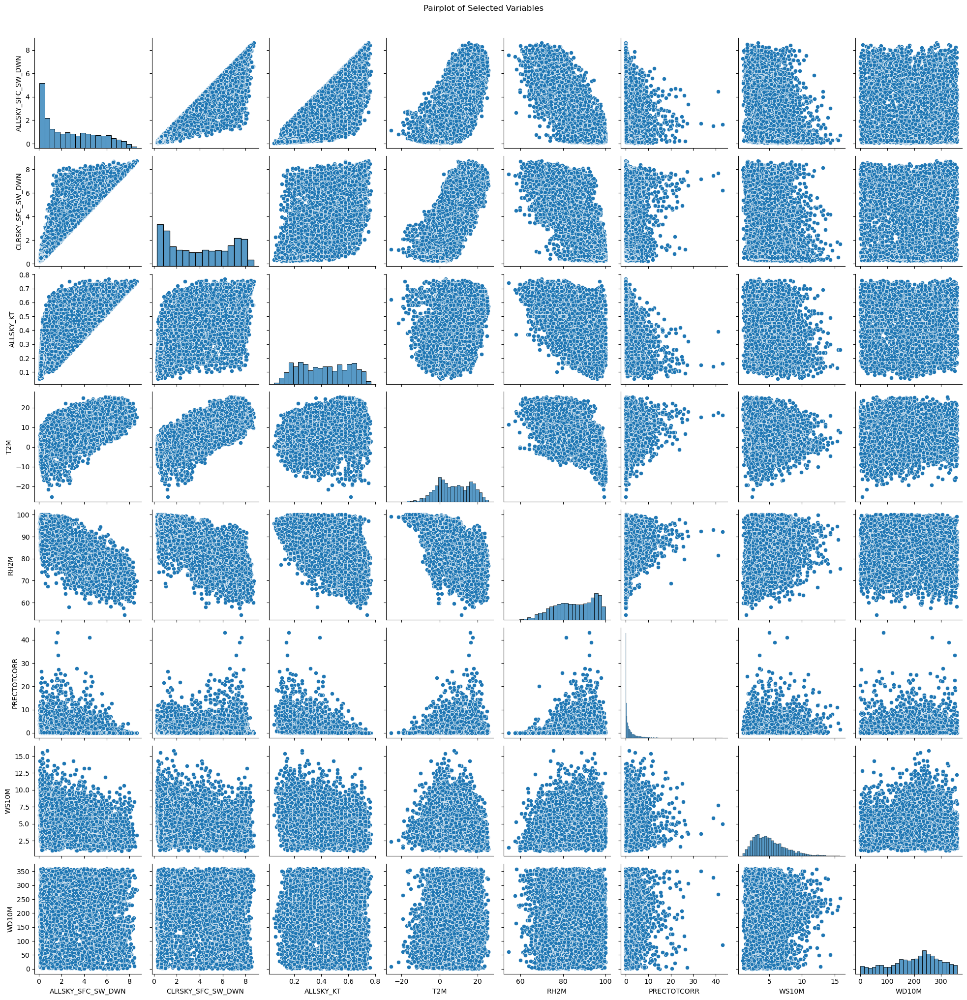

In [28]:
sns.pairplot(dataset[selected_variables])
plt.suptitle('Pairplot of Selected Variables', y=1.02)
plt.show()

Text(0.5, 1.0, 'Solar Irradiance by Temperature and Wind Speed')

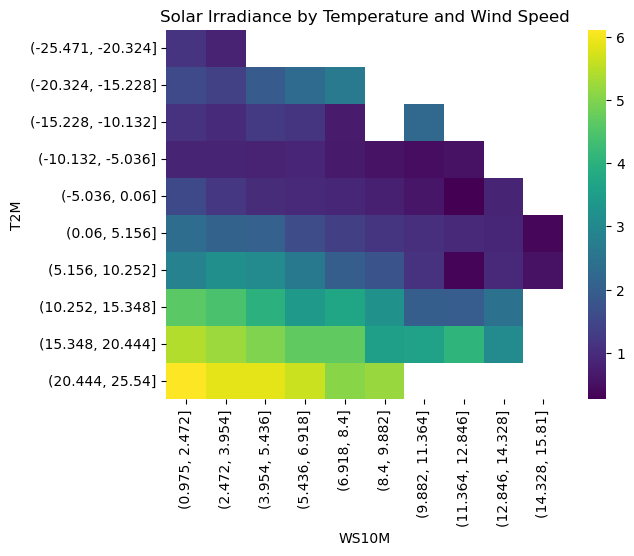

In [29]:
pivot_table = dataset.pivot_table(
    values='ALLSKY_SFC_SW_DWN',
    index=pd.cut(dataset['T2M'], bins=10),
    columns=pd.cut(dataset['WS10M'], bins=10),
    aggfunc='mean')

sns.heatmap(pivot_table, cmap='viridis')
plt.title("Solar Irradiance by Temperature and Wind Speed")

In [30]:
fig = px.scatter_3d(
    dataset, x='T2M', y='WS10M', z='ALLSKY_SFC_SW_DWN',
    color='RH2M', title="Solar vs. Temperature vs. Wind (Colored by Humidity)")
fig.show()

In [31]:
# having a copy of the main dataset for this task , in order not to change the original one
dataset_resetindex= dataset.copy()

# Categorize into Season
def get_season(month):
    if month in ['December', 'January', 'February']:
        return 'Winter'
    elif month in ['March', 'April', 'May']:
        return 'Spring'
    elif month in ['June', 'July', 'August']:
        return 'Summer'
    else:
        return 'Autumn'

dataset_resetindex['Season'] = dataset['Month'].apply(get_season)

# Rename date column if needed (replace 'DATE' with your actual column name)
dataset_resetindex = dataset_resetindex.reset_index().rename(columns={'DATE': 'Date'})  # Adjust based on actual column name

# Create the interactive plot
fig = px.scatter(
    dataset_resetindex,
    x='T2M',
    y='ALLSKY_SFC_SW_DWN',
    color='Season',
    facet_col='City',
    hover_data=['Date', 'RH2M', 'WS10M'],  # using Date column in hover
    title='Temperature vs Solar Irradiance by City and Season',
    labels={
        'T2M': 'Temperature (°C)',
        'ALLSKY_SFC_SW_DWN': 'Solar Irradiance (kW-hr/m²/day)'
    },
    category_orders={
        'Season': ['Winter', 'Spring', 'Summer', 'Autumn'],
        'City': ['Vilnius', 'Tallinn', 'Riga']
    },
    opacity=0.7,
    height=500)

# Customize layout
fig.update_layout(
    legend_title_text='Season',
    plot_bgcolor='white',
    hovermode='closest')

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey')
fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey')
fig.show()

### Understanding the Trend Component in Seasonal Decomposition
The trend in the followin analysis comes from seasonal decomposition, which breaks a time series into three main components:

$$ Y_t = \text{Trend}_t + \text{Seasonal}_t + \text{Residual}_t $$

Where:

- Y(t) = Original time series (e.g., ALLSKY_SFC_SW_DWN)
- Trend(t) = Underlying long-term movement in the data
- Seasonal(t)= Seasonal component
- Residual(t) = Remaining noise and random fluctuations  


How the Trend is Calculated?  
1. Smoothing with a Moving Average  
To extract the trend component, seasonal_decompose() smooths the time series using a moving average over a fixed period (in your case, 365 days for a yearly cycle).

For an additive model:

$$ \text{Trend}_t = \frac{1}{N} \sum_{i=t-k}^{t+k} Y_i $$


where:
- 𝑁 is the window size (365 for yearly data)
- 𝑘 is half the window size
- The sum is taken over a centered moving average to remove seasonal effects.    
This moving average filters out short-term fluctuations and shows the underlying trend.  

2. Handling Missing Edges with Extrapolation
When applying a moving average, the trend calculation lacks values at the beginning and end of the series. To fix this, we used this code:
- " seasonal_decompose(city_series, model='additive', period=365, extrapolate_trend='freq') "  which fills missing trend values at the edges using interpolation.  


In [32]:
# Create a subplot with 1 row and 2 columns
fig = make_subplots(rows=3, cols=1,
                    subplot_titles=['Trend of ALLSKY_SFC_SW_DWN for All Cities',
                                    'Trend of CLRSKY_SFC_SW_DWN for All Cities',
                                    'Trend of ALLSKY_KT for All Cities'], vertical_spacing=0.05)

def Plot_trend(variable):

    trend_data = []
    cities = dataset['City'].unique()

    for city in cities:
        # Extract city's time series
        city_series = dataset[dataset['City'] == city][variable]

        # Ensure the index is a DatetimeIndex and set the frequency
        city_series = city_series.asfreq('D')

        # Perform seasonal decomposition with trend extrapolation
        decomposition = seasonal_decompose(city_series, model='additive', period=365, extrapolate_trend='freq')

        # Extract trend component
        trend_df = decomposition.trend.reset_index()
        trend_df.columns = ['Date', 'Trend']
        trend_df['City'] = city

        # Drop NaN values from the trend component
        trend_df = trend_df.dropna()

        trend_data.append(trend_df)

    # Combine all city trends
    trend_all_cities = pd.concat(trend_data, ignore_index=True)

    return trend_all_cities

# plot ALLSKY_SFC_SW_DWN trend
ALLSKY_SFC_SW_DWN_trend = Plot_trend('ALLSKY_SFC_SW_DWN')
ALLSKY_SFC_SW_DWN_fig = px.line(ALLSKY_SFC_SW_DWN_trend, x='Date', y='Trend', color='City',
              title='Trend of ALLSKY_SFC_SW_DWN for All Cities')
for trace in ALLSKY_SFC_SW_DWN_fig.data:
    fig.add_trace(trace, row=1, col=1)

# plot CLRSKY_SFC_SW_DWN trend
CLRSKY_SFC_SW_DWN_trend = Plot_trend('CLRSKY_SFC_SW_DWN')
CLRSKY_SFC_SW_DWN_fig = px.line(CLRSKY_SFC_SW_DWN_trend, x='Date', y='Trend', color='City',
              title='Trend of ALLSKY_SFC_SW_DWN for All Cities')
for trace in CLRSKY_SFC_SW_DWN_fig.data:
    trace.showlegend = False  # Hide legend for this set
    fig.add_trace(trace, row=2, col=1)

# plot ALLSKY_KT trend
ALLSKY_KT_trend = Plot_trend('ALLSKY_KT')
ALLSKY_KT_fig = px.line(ALLSKY_KT_trend, x='Date', y='Trend', color='City',
              title='Trend of ALLSKY_KT for All Cities')
for trace in ALLSKY_KT_fig.data:
    trace.showlegend = False  # Hide legend for this set
    fig.add_trace(trace, row=3, col=1)

# Update layout to include legend
fig.update_layout(
    title="Trend of Solar-related variables ALLSKY_SFC_SW_DWN, CLRSKY_SFC_SW_DWN, and ALLSKY_KT for Vilnius, Tallinn, and Riga",
    title_font=dict(size=13),
    showlegend=True,
    height=1200)

# Show the plot
fig.show()

# 3.Predictive Analytics:
Can we forecast seasonal or extreme weather events that impact renewable energy generation?

Now that we've explored trends and investigated variable interactions, we'll move into forecasting. This step focuses on building predictive models to forecast seasonal trends or extreme weather events that may impact renewable energy generation.  
**Step 1: Choose the Forecasting Horizon**  
Is daily prediction a good horizon? yes and no
- Yes, if your goal is to provide short-term insights for energy planning.
- Yes, if your dataset contains enough past data points to capture patterns.
- No, if you want long-term predictions (seasonal or yearly trends), where aggregating to weekly/monthly might work better.    
For now, let’s proceed with a **daily forecast** and later we go for other horizons.  

**Step 2: Select Suitable Models**
Since we have multiple meteorological predictors, we can explore different regression models:

- **Traditional Time Series Models**
    - ARIMA/SARIMA (Autoregressive Integrated Moving Average): Good if solar radiation follows a clear seasonal pattern.(if we only rely on past values of solar radiation for forecasting (univariate approach)  

- **Machine Learning Models**  
    - Random Forest Regression: Handles nonlinear relationships well and works with multiple predictors.
    - Gradient Boosting (XGBoost, LightGBM, CatBoost)
    - Support Vector Regression (SVR)  
      These algorithms are very good if we want to use all meteorological variables as predictors.  

- **Deep Learning Models (For Advanced Forecasting)**
    - LSTM (Long Short-Term Memory Networks)    
    - Using Transformers arcitectue.  
      These are the best options if we want to leverage time dependencies in past data and model sequential dependencies.

In [33]:
dataset.drop(columns=['Month'])

,ALLSKY_SFC_SW_DWN,CLRSKY_SFC_SW_DWN,ALLSKY_KT,ALLSKY_SFC_LW_DWN,ALLSKY_SFC_UVA,ALLSKY_SFC_UV_INDEX,T2M,T2MDEW,T2MWET,TS,QV2M,RH2M,PRECTOTCORR,PS,WS10M,WS10M_MAX,WS10M_MIN,WS10M_RANGE,WD10M,City
DATE,,,,,,,,,,,,,,,,,,,,
2018-01-01,0.14,0.66,0.10,7.15,0.01,0.01,0.88,0.63,0.76,0.56,4.07,98.22,4.49,98.35,4.74,6.80,3.03,3.77,196.0,Vilnius
2018-01-02,0.28,0.79,0.20,7.00,0.02,0.01,0.03,-0.22,-0.10,-0.06,3.79,98.21,0.88,98.88,2.76,3.30,2.02,1.28,190.2,Vilnius
2018-01-03,0.24,0.77,0.17,7.09,0.01,0.01,0.10,-0.23,-0.06,-0.19,3.81,97.80,0.64,98.38,3.30,5.09,1.95,3.14,163.5,Vilnius
2018-01-04,0.21,0.71,0.14,7.30,0.01,0.01,1.03,0.72,0.88,0.71,4.11,97.68,0.59,97.79,5.52,6.01,5.11,0.90,172.5,Vilnius
2018-01-05,0.30,0.76,0.20,7.41,0.02,0.01,0.82,0.52,0.67,0.62,4.04,97.75,2.33,97.97,5.64,7.00,4.66,2.34,176.7,Vilnius
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-27,0.29,0.59,0.27,6.64,0.02,0.01,0.25,-0.41,-0.08,-0.04,3.73,95.95,2.15,100.01,7.00,7.95,5.72,2.23,233.5,Riga
2022-12-28,0.29,0.54,0.27,6.80,0.02,0.01,0.43,-0.12,0.15,0.36,3.75,96.00,2.55,100.53,5.90,7.35,4.79,2.56,228.3,Riga
2022-12-29,0.22,0.50,0.20,6.93,0.01,0.01,0.28,-0.13,0.08,0.29,3.78,97.20,2.61,99.98,5.84,7.35,4.81,2.54,177.4,Riga


we do not need to normalize (or standardize) our data when using Random Forest Regression because:  
Unlike algorithms such as linear regression, SVMs, or neural networks, Random Forest is tree-based, meaning: 1-It splits data at thresholds rather than relying on distances an therefore Scaling does not affect splits. 2-It is invariant to monotonic transformations and therefore Normalization or standardization does not improve performance. 3-It handles raw numerical features well and No need for MinMaxScaler or StandardScaler.  

If we switch to distance-based models like SVM, or Neural Networks or If we plan to use gradient-boosting models such as XGBoost, LightGBM, where scaling can help, then we need to normalize our dataset before going to training part.

In [34]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from tqdm import tqdm

In [35]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import TimeSeriesSplit
import matplotlib.pyplot as plt

# ---------------------------
# 1. Data Preparation
# ---------------------------

df= dataset.copy()

# Convert City to one-hot encoding
df = pd.get_dummies(df, columns=['City'], drop_first=True)

# ---------------------------
# 2. Temporal Data Splitting
# ---------------------------

# Split BEFORE feature engineering to prevent leakage
train_mask = df.index.year < 2022
train_df = df[train_mask].copy()
test_df = df[~train_mask].copy()

# ---------------------------
# 3. Time-Series Feature Engineering
# ---------------------------

def create_features(df):
    """Create time features + lagged values (applied per split)"""
    # Time-based features
    df = df.assign(
        Year = df.index.year,
        Month = df.index.month,
        DayOfYear = df.index.dayofyear,
        WeekOfYear = df.index.isocalendar().week.astype(int) )

    # Lagged solar radiation (prevents lookahead bias)
    for lag in [1, 7, 30]:  # 1d, 7d, 30d lags
        df[f'lag_{lag}'] = df['ALLSKY_SFC_SW_DWN'].shift(lag)

    # Rolling statistics (using only past data)
    df['rolling_7_mean'] = df['ALLSKY_SFC_SW_DWN'].shift(1).rolling(7).mean()

    return df.dropna()

train_df = create_features(train_df)
test_df = create_features(test_df)

# ---------------------------
# 4. Feature/Target Definition
# ---------------------------

X_train = train_df.drop(columns=['ALLSKY_SFC_SW_DWN'])
y_train = train_df['ALLSKY_SFC_SW_DWN']

X_test = test_df.drop(columns=['ALLSKY_SFC_SW_DWN'])
y_test = test_df['ALLSKY_SFC_SW_DWN']

# Ensure numeric features only
X_train = X_train.select_dtypes(include=np.number)
X_test = X_test.select_dtypes(include=np.number)

# ---------------------------
# 5. Time-Series Validation
# ---------------------------

# Use expanding window cross-validation
tscv = TimeSeriesSplit(n_splits=5)
mae_scores, rmse_scores = [], []

for fold, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
    # Split fold data
    X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

    # Train model
    model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
    model.fit(X_tr, y_tr)

    # Validate
    preds = model.predict(X_val)
    mae = mean_absolute_error(y_val, preds)
    rmse = np.sqrt(mean_squared_error(y_val, preds))

    mae_scores.append(mae)
    rmse_scores.append(rmse)
    print(f"Fold {fold+1}: MAE={mae:.3f}, RMSE={rmse:.3f}")

print(f"\nCross-Validation MAE: {np.mean(mae_scores):.3f} ± {np.std(mae_scores):.3f}")
print(f"Cross-Validation RMSE: {np.mean(rmse_scores):.3f} ± {np.std(rmse_scores):.3f}")

# ---------------------------
# 6. Final Model Training
# ---------------------------

# Retrain on full training data
final_model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
final_model.fit(X_train, y_train)

# ---------------------------
# 7. Test Set Evaluation
# ---------------------------

test_preds = final_model.predict(X_test)
test_mae = mean_absolute_error(y_test, test_preds)
test_rmse = np.sqrt(mean_squared_error(y_test, test_preds))

print(f"\nTest MAE: {test_mae:.3f}")
print(f"Test RMSE: {test_rmse:.3f}")

Fold 1: MAE=0.100, RMSE=0.137
Fold 2: MAE=0.101, RMSE=0.140
Fold 3: MAE=0.083, RMSE=0.117
Fold 4: MAE=0.167, RMSE=0.222
Fold 5: MAE=0.131, RMSE=0.182

Cross-Validation MAE: 0.116 ± 0.030
Cross-Validation RMSE: 0.159 ± 0.038

Test MAE: 0.092
Test RMSE: 0.139


In [36]:
# ---------------------------
# 8. Visualization
# ---------------------------

# Create interactive plot for perdiction representing
fig = go.Figure()

# Add actual vs predicted traces
fig.add_trace(
    go.Scatter(
        x=y_test.index,
        y=y_test,
        mode='lines',
        name='Actual',
        line=dict(color='#1f77b4', width=2),
        hovertemplate='Date: %{x|%Y-%m-%d}<br>Value: %{y:.2f} kW-hr/m²/day<extra></extra>'
    )
)

fig.add_trace(
    go.Scatter(
        x=y_test.index,
        y=test_preds,
        mode='lines',
        name='Predicted',
        line=dict(color='#ff7f0e', width=2, dash='dot'),
        hovertemplate='Date: %{x|%Y-%m-%d}<br>Value: %{y:.2f} kW-hr/m²/day<extra></extra>'
    )
)

# Customize layout
fig.update_layout(
    title='Solar Radiation Forecast: Actual vs Predicted',
    xaxis_title='Date',
    yaxis_title='Solar Radiation (kW-hr/m²/day)',
    template='plotly_white',
    hovermode='x unified',
    legend=dict(
        orientation='h',
        yanchor='bottom',
        y=1.02,
        xanchor='right',
        x=1
    ),
    margin=dict(l=50, r=20, t=80, b=50),
    height=500)

# Add range slider
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=7, label="1w", step="day", stepmode="backward"),
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=3, label="3m", step="month", stepmode="backward"),
            dict(step="all")
        ])
    )
)

# Add custom hover styling
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=12,
        font_family="Arial"
    )
)

fig.show()